### 1. Se pide:

A partir del archivo "USA_Housing.csv", realizar la regresión no lineal entre cada columna numérica con la columna 'price' utilizando:

- Regresión polinómica no lineal con grados del 2 al 10. ¿El score se estanca a partir de cierto grado?
- SVR

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns 

df = pd.read_csv("../data/USA_Housing.csv")
df.head()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Address
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,"208 Michael Ferry Apt. 674\r\nLaurabury, NE 37..."
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,"188 Johnson Views Suite 079\r\nLake Kathleen, ..."
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,"9127 Elizabeth Stravenue\r\nDanieltown, WI 064..."
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,USS Barnett\r\nFPO AP 44820
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,USNS Raymond\r\nFPO AE 09386


In [2]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.metrics import accuracy_score


################
polynominal linear regression with degree = 7


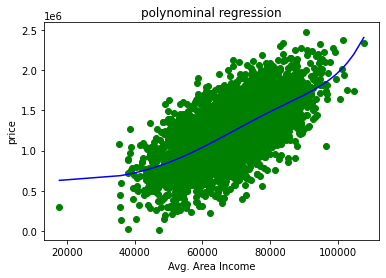

MAE: 210041.00598124825
Score of polynominal regression of Avg. Area Income, with degree 7: 0.40445951984471884


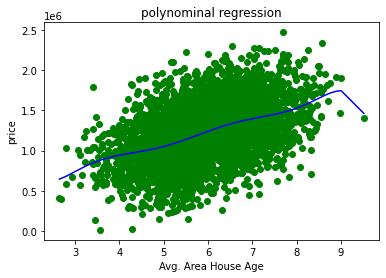

MAE: 239506.26423739686
Score of polynominal regression of Avg. Area House Age, with degree 7: 0.22299617712949882


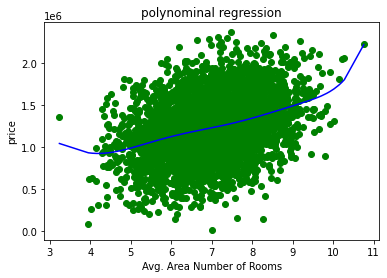

MAE: 255931.15445358134
Score of polynominal regression of Avg. Area Number of Rooms, with degree 7: 0.11932945199371192


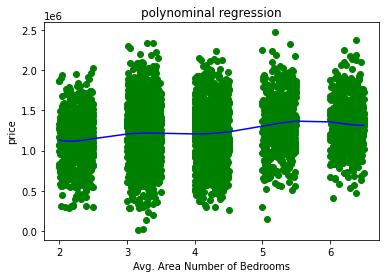

MAE: 273697.8548605804
Score of polynominal regression of Avg. Area Number of Bedrooms, with degree 7: 0.027642116902487635


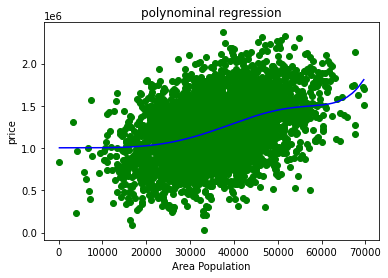

MAE: 256956.8508434794
Score of polynominal regression of Area Population, with degree 7: 0.15772230990693048
################
polynominal linear regression with degree = 8


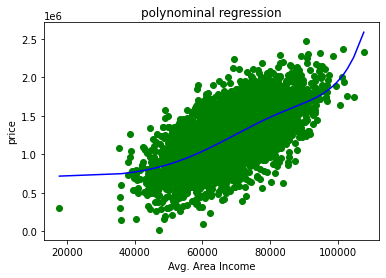

MAE: 213080.73484897416
Score of polynominal regression of Avg. Area Income, with degree 8: 0.4555517341871943


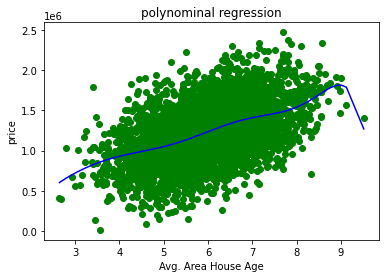

MAE: 252969.1763085831
Score of polynominal regression of Avg. Area House Age, with degree 8: 0.13486133093241437


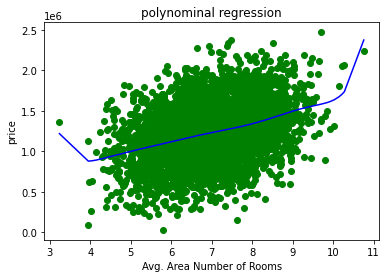

MAE: 256667.28930807297
Score of polynominal regression of Avg. Area Number of Rooms, with degree 8: 0.11788940434385387


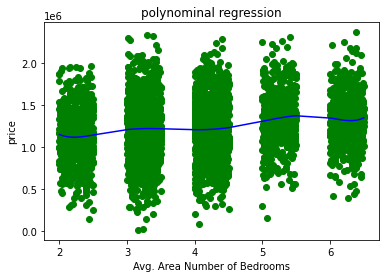

MAE: 284011.3012370686
Score of polynominal regression of Avg. Area Number of Bedrooms, with degree 8: 0.02621985249999248


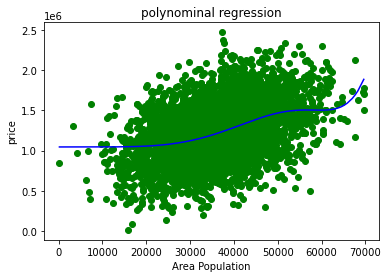

MAE: 263342.9924091809
Score of polynominal regression of Area Population, with degree 8: 0.1544006356156613


In [3]:
# polynominal linear regression with degree = 7 and 8. For the exercise put 2 and 10, but kernel freezes/gets stuck with that many inputs. 
degree_min = 7
degree_max = 8

for degree in range(degree_min,degree_max+1):
    print("################")
    print("polynominal linear regression with degree =", degree)

    for elem in df._get_numeric_data().columns:
        if elem != "Price":

            X = df[[elem]].values
            y = df.Price
            X_train, X_test, y_train, y_test = train_test_split(X, y ,test_size=0.2)

            polinominal_model = PolynomialFeatures(degree) 
            X_poly = polinominal_model.fit_transform(X_train, y_train)

            lin_reg_model = LinearRegression()
            lin_reg_model.fit(X_poly, y_train)

            y_pred = lin_reg_model.predict(X_poly)

            X_train_to_show, y_train_to_show = zip(*sorted(zip(X_train, y_train)))
            plt.scatter(X_train_to_show, y_train_to_show, color="green")
            X_train_to_show, y_pred = zip(*sorted(zip(X_train, y_pred)))
            plt.plot(X_train_to_show, y_pred, color="blue")


            plt.title("polynominal regression")
            plt.ylabel("price")
            plt.xlabel(elem)
            plt.show()

            #score
            X_test_poly = polinominal_model.fit_transform(X_test, y_test)
            y_test_pred = lin_reg_model.predict(X_test_poly)
            score = lin_reg_model.score(X_test_poly, y_test)
            print("MAE:", mean_absolute_error(y_test, y_test_pred))
            print("Score of polynominal regression of {}, with degree {}:".format(elem, degree), score)
            



In [4]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler

################
Support Vector Regression Model with kernel = rbf
---------
Score of Support Vector Regression Model of Avg. Area Income: 0.412831035638503
MAE: 0.6015061086263231


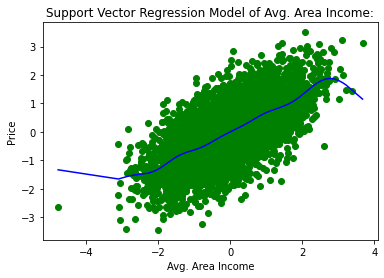

---------
Score of Support Vector Regression Model of Avg. Area House Age: 0.20260898158752638
MAE: 0.7203745247519855


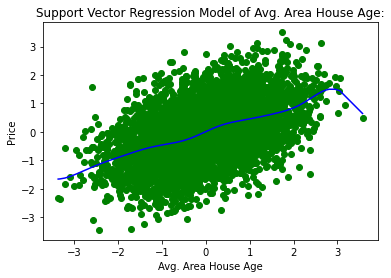

---------
Score of Support Vector Regression Model of Avg. Area Number of Rooms: 0.08339406353052203
MAE: 0.7645734062715671


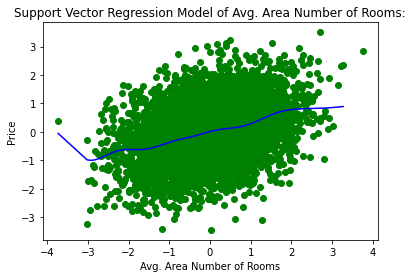

---------
Score of Support Vector Regression Model of Avg. Area Number of Bedrooms: 0.046204201999934025
MAE: 0.7835621458167858


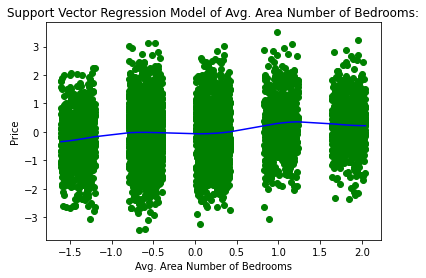

---------
Score of Support Vector Regression Model of Area Population: 0.18216162432505756
MAE: 0.7293080880364692


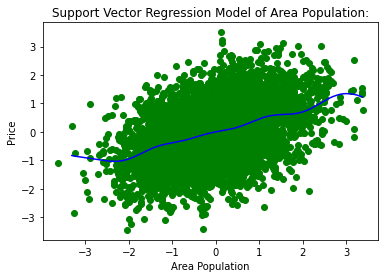

################
Support Vector Regression Model with kernel = linear
---------
Score of Support Vector Regression Model of Avg. Area Income: 0.3604808389805557
MAE: 0.6288551025450849


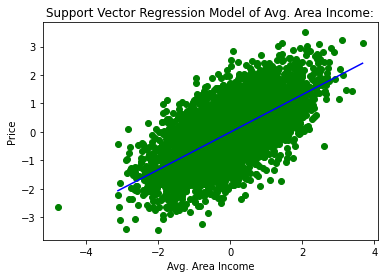

---------
Score of Support Vector Regression Model of Avg. Area House Age: 0.17836778714982504
MAE: 0.6954933332210801


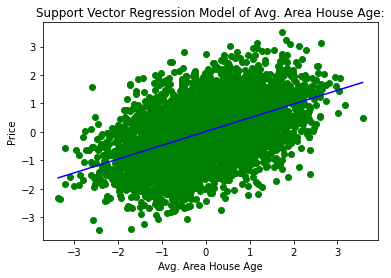

---------
Score of Support Vector Regression Model of Avg. Area Number of Rooms: 0.09640558524280252
MAE: 0.7679312028630031


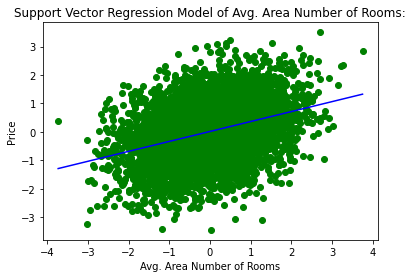

---------
Score of Support Vector Regression Model of Avg. Area Number of Bedrooms: 0.03596121397151264
MAE: 0.7964981883885262


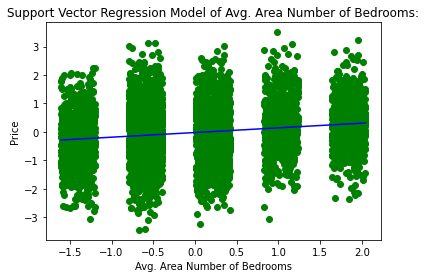

---------
Score of Support Vector Regression Model of Area Population: 0.1582624494324577
MAE: 0.7219200127925396


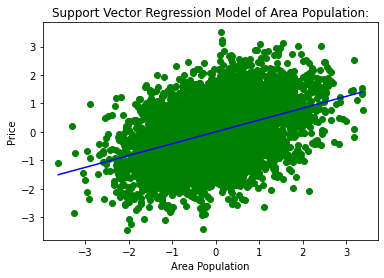

################
Support Vector Regression Model with kernel = poly
---------
Score of Support Vector Regression Model of Avg. Area Income: 0.29763549220508967
MAE: 0.6771982902330074


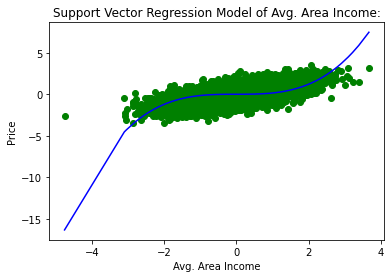

---------
Score of Support Vector Regression Model of Avg. Area House Age: 0.13924200108700469
MAE: 0.7393314209920869


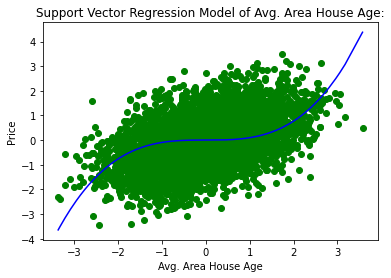

---------
Score of Support Vector Regression Model of Avg. Area Number of Rooms: 0.08014088834726307
MAE: 0.774956215404731


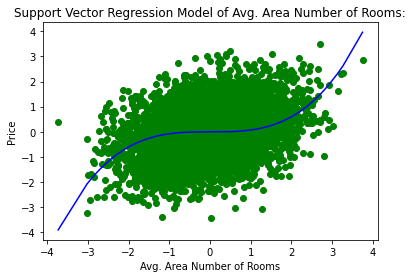

---------
Score of Support Vector Regression Model of Avg. Area Number of Bedrooms: 0.016242859607359716
MAE: 0.7831375657954477


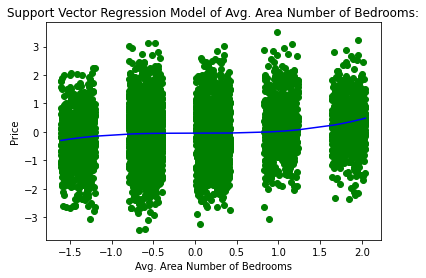

---------
Score of Support Vector Regression Model of Area Population: 0.11895429650280809
MAE: 0.7456163506517285


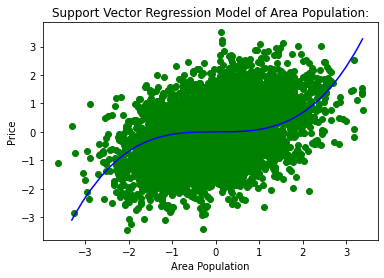

In [5]:
#using SVR
kernel = ['rbf', 'linear', 'poly']
for kernel in kernel:
    print("################")
    print("Support Vector Regression Model with kernel =", kernel)

    for elem in df._get_numeric_data().columns:
            if elem != "Price": 
                print("---------")
                X = df[[elem]].values
                y = df[["Price"]]

                sc_X = StandardScaler()
                sc_y = StandardScaler()
                X = sc_X.fit_transform(X)
                y = sc_y.fit_transform(y)

                X_train, X_test, y_train, y_test = train_test_split(X, y ,test_size=0.2)
                model = SVR(kernel=kernel)
                model.fit(X_train, y_train)
                y_prediction = model.predict(X_train)
                score = model.score(X_test, y_test)
                print("Score of Support Vector Regression Model of {}:".format(elem), score)
                y_test_pred = model.predict(X_test)
                print("MAE:", mean_absolute_error(y_test, y_test_pred))


                plt.scatter(X, y, color = 'green')
                X_train_to_show, y_pred = zip(*sorted(zip(X_train, y_prediction)))
                plt.plot(X_train_to_show, y_pred, color="blue")
                plt.title("Support Vector Regression Model of {}:".format(elem))
                plt.xlabel(elem)
                plt.ylabel('Price')
                plt.show()



### 2. Se pide:

En el anterior dataset, la columna "Avg. Area Number of Bedrooms" está en un rango numérico limitado:

1. Cambia todos los datos para que sean enteros redondeando hacia el entero más cercano. Si es .5 exacto, se redondea hacia abajo.

2. Cuando lo hayas hecho, tendras una columna con números enteros en un rango limitado. Ahora trata a esa columna como una serie de valores discretos (classes, labels). 

3. Usando las demás columnas numéricas y una a una, utiliza SVM para clasificar esa columna modificada.

4. Usando todas las demás columnas a la vez, utiliza SVM para clasificar esa columna modificada. Es decir, "Avg. Area Income" con nuestro target, después "Avg. Area House Age", ...  

5. ¿Qué columna tiene mejor correlación con "Avg. Area Number of Bedrooms" una vez modificada? ¿qué columna da mejor score para nuestro target? 

6. Utilizar todas las columnas a la vez para clasificar "Avg. Area Number of Bedrooms", ¿hace aumentar el score? ¿por qué?

In [7]:
#changing column to all integers
# "Avg. Area Number of Bedrooms" = class
df["Avg. Area Number of Bedrooms"] = df["Avg. Area Number of Bedrooms"].astype(int)

In [10]:
from sklearn import svm

---------
score: 0.307


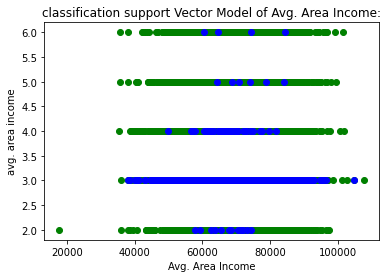

---------
score: 0.315


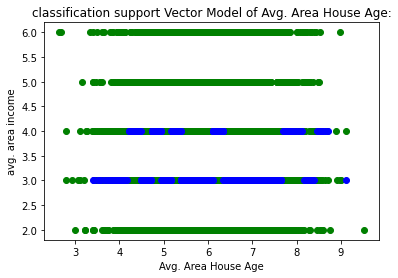

---------
score: 0.296


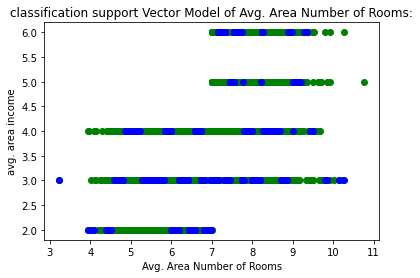

---------
score: 0.307


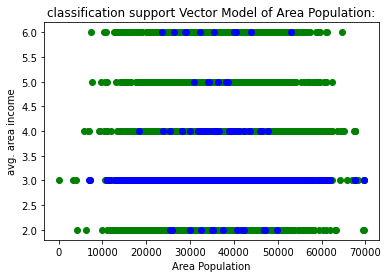

---------
score: 0.304


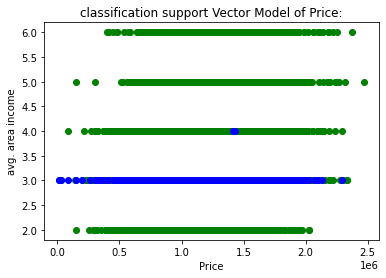

In [11]:
#using svc one column at the time:
score_list = []
column = []

for elem in df._get_numeric_data().columns:
        if elem != "Avg. Area Number of Bedrooms":
            print("---------")
            y = df[["Avg. Area Number of Bedrooms"]].values
            X = df[[elem]].values
            X = X.reshape(-1, 1)

            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=109)
            
            # SVM Parameters
            C = 100
            gamma = 10

            # rbf -- Radial basis function
            clf = svm.SVC(C=C, kernel='rbf', gamma=gamma)
            clf.fit(X_train, y_train)
            y_pred = clf.predict(X_test)
            score = clf.score(X_test, y_test)
            print ('score:', score)

            score_list.append(score)
            column.append(elem)

            plt.scatter(X,y, color="green")
            plt.scatter(X_test, y_pred, color="blue")
            plt.xlabel(elem)
            plt.ylabel("avg. area income")
            plt.title("classification support Vector Model of {}:".format(elem))
            plt.show()


In [12]:
#Showing score overview:
df_score = pd.DataFrame(score_list, index=column)
df_score.rename(columns={0: "score"}, inplace=True)
df_score

,score
Avg. Area Income,0.307
Avg. Area House Age,0.315
Avg. Area Number of Rooms,0.296
Area Population,0.307
Price,0.304


Highest score is with column avg house age. 

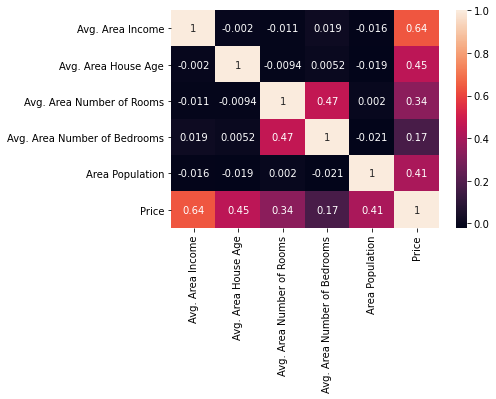

In [14]:
#seeing correlation in df
import seaborn as sns
sns.heatmap(df.corr(), annot=True)

avg. area of bedroom has most correlation with avg. number of rooms and the price. 

-> but why is score higher with avg house age. than with avg. number of rooms? 

In [15]:
#Usando todas las demás columnas en una vez, utiliza SVM para clasificar esa columna modificada


y = df[["Avg. Area Number of Bedrooms"]].values
X = df.drop(["Avg. Area Number of Bedrooms", "Address"], 1).values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)


# SVM Parameters
C = 100
gamma = 10

# rbf -- Radial basis function
clf = svm.SVC(C=C, kernel='rbf', gamma=gamma)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
score = clf.score(X_test, y_test)
print ('score:', score) 


#plt gives erros -> Cannot make plot as x axis has more values as y. 
#plt.scatter(X,y, color="green")
#plt.scatter(X_test, y_pred, color="blue")
#plt.scatter(X_test, y_test, color="red")
#plt.xlabel(elem)
#plt.ylabel("avg. area income")
#plt.title("classification support Vector Model of {}:".format(elem))
#plt.show()

score: 0.299


The score is lower when doing SVM with all the columns at once.